                                                        RECOMMENDER SYSTEM

The dataset contains the following attributes Invoice Number ,Stock Code, Description,Quantity,Invoice Date, Unit Price,Customer ID,Country. 

                                                            OBJECTIVE 
The main objective of this project is to create a recommender system that will  recommend products based on Collaborative Filtering method and Content-Base Filtering method results in robust hybrid recommendation system . 


FOLLOWING THE ARCHITECTURE DIAGRAM

IMPORT ALL THE LIBRARIES

In [2]:
import pandas as pd
import seaborn as sns
import numpy as np # linear algebra

import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


THE PATH TO THE CSV FILE IS READ INTO THE PANDAS DATAFRAME OBJECT

In [3]:
df = pd.read_csv('C:\Projects\Recommendation_System\OnlineRetail.csv')
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12-01-2010,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12-01-2010,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12-01-2010,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12-01-2010,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12-01-2010,3.39,17850.0,United Kingdom


TO CHECK FOR NULL VALUES AND REMOVAL

In [4]:
df.isnull()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...
541904,False,False,False,False,False,False,False,False
541905,False,False,False,False,False,False,False,False
541906,False,False,False,False,False,False,False,False
541907,False,False,False,False,False,False,False,False


In [5]:
df.dropna()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12-01-2010,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12-01-2010,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12-01-2010,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12-01-2010,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12-01-2010,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12-09-2011,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12-09-2011,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12-09-2011,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12-09-2011,4.15,12680.0,France


SEABORN TO VISUALIZE THE RELATIONSHIP OF THE PRODUCTS AND QUANTITY AVAILABLE 

c:\Users\LAU\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\LAU\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\LAU\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


Text(0, 0.5, 'Number of Quantity')

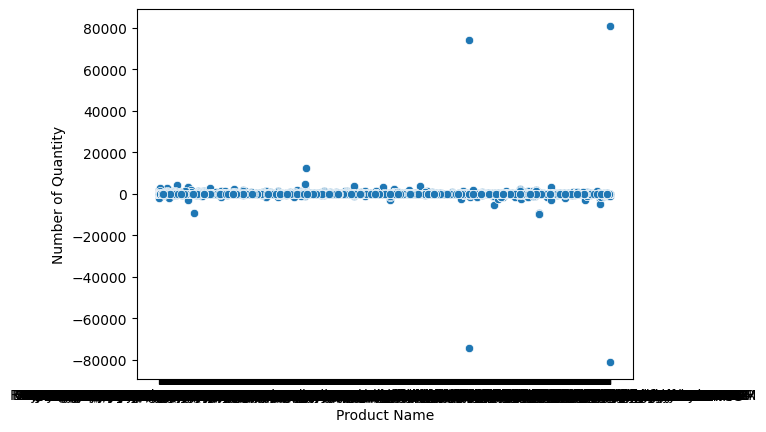

In [6]:
sns.scatterplot(
    x='Description', 
    y='Quantity', 
    data=df
)
plt.xlabel('Product Name')
plt.ylabel('Number of Quantity')

TO CHECK FOR REPEATED PRODUCTS IN THE 'Description' ATTRIBUTE

In [7]:
df1 = df['Description']
duplicates = df1.duplicated()
print("Number of duplicates:", duplicates.sum())

Number of duplicates: 537697


MOST POPULAR ITEM GLOBALLY

In [8]:
duplicated_rows = df1[duplicates]
most_common_duplicates = duplicated_rows.value_counts().head(10)
print(f"Most popular items Globally:\n{most_common_duplicates}")

Most popular items Globally:
Description
WHITE HANGING HEART T-LIGHT HOLDER    2368
REGENCY CAKESTAND 3 TIER              2199
JUMBO BAG RED RETROSPOT               2158
PARTY BUNTING                         1726
LUNCH BAG RED RETROSPOT               1637
ASSORTED COLOUR BIRD ORNAMENT         1500
SET OF 3 CAKE TINS PANTRY DESIGN      1472
PACK OF 72 RETROSPOT CAKE CASES       1384
LUNCH BAG  BLACK SKULL.               1349
NATURAL SLATE HEART CHALKBOARD        1279
Name: count, dtype: int64


POPULAR ITEM COUNTRY WISE 

df.groupby(['Country']): This groups the data in df by the 'Country' column, so that the subsequent operations are applied to each group separately.

['Description'].sum(): This selects the 'Description' column from each group and calculates the sum of its values.

.sort_values(ascending=False): This sorts the resulting DataFrame in descending order by the summed 'Description' values.

.reset_index(): This resets the index of the resulting DataFrame so that the indices are sequential integers starting from 0.

In [9]:
most_popular_items = df.groupby(['Country'])['Description'].sum().sort_values(ascending=False).reset_index()


In [10]:
print(most_popular_items.head(25))


                 Country                                        Description
0         United Kingdom  WHITE HANGING HEART T-LIGHT HOLDERWHITE METAL ...
1                 Cyprus  WHITE HANGING HEART T-LIGHT HOLDERSPACE CADET ...
2               Portugal  VINTAGE PAISLEY STATIONERY SETLUNCH BAG SUKI  ...
3                  Italy  T-LIGHT GLASS FLUTED ANTIQUESCENTED VELVET LOU...
4                  Japan  SET OF 6 VINTAGE NOTELETS KITFANCY FONT BIRTHD...
5                Germany  SET OF 6 T-LIGHTS SANTAROTATING SILVER ANGELS ...
6                    USA  SET OF 6 SPICE TINS PANTRY DESIGNPANTRY WASHIN...
7                 Sweden  SET OF 3 BABUSHKA STACKING TINSSET OF 3 BABUSH...
8                Belgium  SET OF 20 KIDS COOKIE CUTTERSRED RETROSPOT ROU...
9            Switzerland  ROUND SNACK BOXES SET OF4 WOODLANDPLASTERS IN ...
10                Greece  ROSES REGENCY TEACUP AND SAUCERGREEN REGENCY T...
11                  EIRE  ROSE COTTAGE KEEPSAKE BOXBLUE CHARLIE+LOLA PER...
12  United A

POPULAR ITEMS MONTH WISE

In [11]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])#extracT specific components like month, day, or year.
df['Month'] = df['InvoiceDate'].dt.month#'Month' column will contain integer values ranging from 1 to 12,


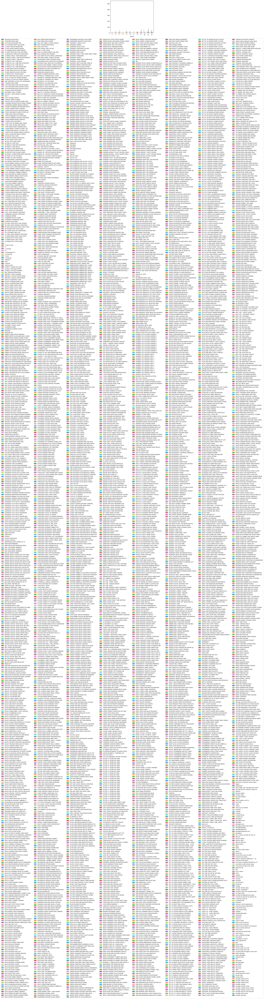

In [12]:
counts = df.groupby(['Month', 'Description']).size().reset_index(name='Counts')
pivot_counts = counts.pivot(index='Month', columns='Description', values='Counts')
ax=pivot_counts.plot(kind='bar')
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=8)
plt.show()


output the number of unique items 

In [13]:
df["Description"].nunique()


4211

This provides you with the top 5 most frequently occurring values in the 'Description' column.

In [14]:
df["Description"].value_counts().head()

Description
WHITE HANGING HEART T-LIGHT HOLDER    2369
REGENCY CAKESTAND 3 TIER              2200
JUMBO BAG RED RETROSPOT               2159
PARTY BUNTING                         1727
LUNCH BAG RED RETROSPOT               1638
Name: count, dtype: int64

RARE ITEMS OR NOT POPULAR ITEMS ARE REMOVED 

In [15]:

item_counts = df['Description'].value_counts()#contains the count of each unique value in the 'Description' column of df, sorted in descending order.

rare_items = item_counts[item_counts <= 200].index# filters out the rare items from df. In this case, rare items are defined as those that occur less than or equal to 200 times in the 'Description' column of df

common_items= df[~df['Description'].isin(rare_items)]#Outputs rows where the 'Description' value is not in rare_movies are selected.
common_items.shape
#df.to_csv('cleaned_metadata.csv', index=False)

#Note that the threshold value of 200 used to define rare items is arbitrary and can be adjusted as needed, depending on the size of the dataset and the distribution of values in the 'Description' column.

(359329, 9)

UNIQUE ITEMS IN COMMON ITEMS

In [16]:
common_items["Description"].nunique()

844

USER ITEM MATRIX OF COMMON_ITEMS

In [17]:
user_item_df = common_items.pivot_table(index=["CustomerID"], columns=["Description"], values="Quantity")
#This rearranges the DataFrame so that each row represents a unique CustomerID, each column represents a unique Description.
# The values are the Quantity of that item purchased by the corresponding customer.
user_item_df.shape

(4317, 844)

In [18]:
user_item_df.head(10)

Description,10 COLOUR SPACEBOY PEN,12 MESSAGE CARDS WITH ENVELOPES,12 PENCIL SMALL TUBE WOODLAND,12 PENCILS SMALL TUBE RED RETROSPOT,12 PENCILS SMALL TUBE SKULL,12 PENCILS TALL TUBE RED RETROSPOT,12 PENCILS TALL TUBE SKULLS,12 PENCILS TALL TUBE WOODLAND,15CM CHRISTMAS GLASS BALL 20 LIGHTS,20 DOLLY PEGS RETROSPOT,...,WOODLAND CHARLOTTE BAG,WORLD WAR 2 GLIDERS ASSTD DESIGNS,WRAP ALPHABET DESIGN,WRAP ENGLISH ROSE,YOU'RE CONFUSING ME METAL SIGN,ZINC FOLKART SLEIGH BELLS,ZINC HERB GARDEN CONTAINER,ZINC METAL HEART DECORATION,ZINC T-LIGHT HOLDER STARS SMALL,ZINC WILLIE WINKIE CANDLE STICK
CustomerID,,,,,,,,,,,,,,,,,,,,,
12346.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12347.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12348.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12349.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.0,...,NaN,NaN,NaN,NaN,NaN,12.0,NaN,NaN,NaN,NaN
12350.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12352.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12353.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12354.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12355.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


CORRELATION BETWEEN item_name AND ALL OTHER ITEMS USING USER ITEM MATRIX

In [19]:
#The resulting output is a Pandas Series containing the 10 most highly correlated items with the "WHITE HANGING HEART T-LIGHT HOLDER" item, based on the user-item matrix.
item_name = "WHITE HANGING HEART T-LIGHT HOLDER"
item_name = user_item_df[item_name]
user_item_df.corrwith(item_name).sort_values(ascending=False).head(10)

c:\Users\LAU\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\function_base.py:2846: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
c:\Users\LAU\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\function_base.py:2705: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
c:\Users\LAU\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\lib\function_base.py:2705: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Description
WHITE HANGING HEART T-LIGHT HOLDER     1.000000
GOLD MINI TAPE MEASURE                 0.999001
PANTRY ROLLING PIN                     0.996160
HOME SWEET HOME MUG                    0.993323
FAIRY CAKE FLANNEL ASSORTED COLOUR     0.988119
SET OF 2 TEA TOWELS APPLE AND PEARS    0.987737
GIN AND TONIC MUG                      0.986735
DOORSTOP RETROSPOT HEART               0.983452
HOMEMADE JAM SCENTED CANDLES           0.980501
SKULL SHOULDER BAG                     0.979886
dtype: float64

In [20]:
# Let's choosE/select a random user from the user-item matrix.
random_user = int(pd.Series(user_item_df.index).sample(1, random_state=45).values)
print(random_user)

16143


In [21]:
random_user_df = user_item_df[user_item_df.index == random_user]
random_user_df#random_user_df represent the items in the user-item matrix, and the values represent the quantity of each item purchased by the random user.

Description,10 COLOUR SPACEBOY PEN,12 MESSAGE CARDS WITH ENVELOPES,12 PENCIL SMALL TUBE WOODLAND,12 PENCILS SMALL TUBE RED RETROSPOT,12 PENCILS SMALL TUBE SKULL,12 PENCILS TALL TUBE RED RETROSPOT,12 PENCILS TALL TUBE SKULLS,12 PENCILS TALL TUBE WOODLAND,15CM CHRISTMAS GLASS BALL 20 LIGHTS,20 DOLLY PEGS RETROSPOT,...,WOODLAND CHARLOTTE BAG,WORLD WAR 2 GLIDERS ASSTD DESIGNS,WRAP ALPHABET DESIGN,WRAP ENGLISH ROSE,YOU'RE CONFUSING ME METAL SIGN,ZINC FOLKART SLEIGH BELLS,ZINC HERB GARDEN CONTAINER,ZINC METAL HEART DECORATION,ZINC T-LIGHT HOLDER STARS SMALL,ZINC WILLIE WINKIE CANDLE STICK
CustomerID,,,,,,,,,,,,,,,,,,,,,
16143.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,25.0,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
# Let's choose non-NaN. products bought by all 13246:
products_bought = random_user_df.columns[random_user_df.notna().any()].tolist()
products_bought

['BLUE POLKADOT CUP',
 'BLUE VINTAGE SPOT BEAKER',
 'CHARLIE AND LOLA FIGURES TINS',
 'CHOCOLATE THIS WAY METAL SIGN',
 'COOK WITH WINE METAL SIGN',
 'GARDENERS KNEELING PAD KEEP CALM',
 'GIN + TONIC DIET METAL SIGN',
 'HANGING HEART ZINC T-LIGHT HOLDER',
 'HEART IVORY TRELLIS LARGE',
 'HEART OF WICKER LARGE',
 'HEART OF WICKER SMALL',
 'IVORY WICKER HEART MEDIUM',
 'JUMBO BAG VINTAGE DOILY',
 'LARGE WHITE HEART OF WICKER',
 'LUNCH BAG ALPHABET DESIGN',
 'LUNCH BAG CARS BLUE',
 'LUNCH BAG RED RETROSPOT',
 'LUNCH BAG SUKI  DESIGN',
 'LUNCH BAG VINTAGE DOILY',
 'NATURAL SLATE HEART CHALKBOARD',
 'NATURAL SLATE RECTANGLE CHALKBOARD',
 'NO SINGING METAL SIGN',
 'PARTY BUNTING',
 'PEG BAG APPLES DESIGN',
 'PINK  POLKADOT CUP',
 'PLEASE ONE PERSON METAL SIGN',
 'POTTERING IN THE SHED METAL SIGN',
 'RECIPE BOX BLUE SKETCHBOOK DESIGN',
 'RECIPE BOX PANTRY YELLOW DESIGN',
 'RECIPE BOX RETROSPOT',
 'RED RETROSPOT BUTTER DISH',
 'RED RETROSPOT CUP',
 'RED RETROSPOT OVEN GLOVE',
 'RED RETROSPOT OV

In [23]:
user_item_df.loc[user_item_df.index == random_user, user_item_df.columns == "WRAP ENGLISH ROSE"]#extract the scalar value from the resulting dataframe.

Description,WRAP ENGLISH ROSE
CustomerID,
16143.0,25.0


In [24]:
# How many products have user #13246 bought:
len(products_bought)

65

In [25]:
# The code products_bought_df.shape outputs the dimensions of products_bought_df as a tuple (number of rows, number of columns) 
products_bought_df = user_item_df[products_bought]
products_bought_df.head()
#products_bought_df.shape

Description,BLUE POLKADOT CUP,BLUE VINTAGE SPOT BEAKER,CHARLIE AND LOLA FIGURES TINS,CHOCOLATE THIS WAY METAL SIGN,COOK WITH WINE METAL SIGN,GARDENERS KNEELING PAD KEEP CALM,GIN + TONIC DIET METAL SIGN,HANGING HEART ZINC T-LIGHT HOLDER,HEART IVORY TRELLIS LARGE,HEART OF WICKER LARGE,...,SMALL WHITE HEART OF WICKER,SPOTTY BUNTING,STORAGE TIN VINTAGE DOILY,SUKI SHOULDER BAG,SWEETHEART RECIPE BOOK STAND,TEA TIME OVEN GLOVE,TEA TIME PARTY BUNTING,WHITE WOOD GARDEN PLANT LADDER,WICKER STAR,WRAP ENGLISH ROSE
CustomerID,,,,,,,,,,,,,,,,,,,,,
12346.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12347.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN
12348.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12349.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12350.0,NaN,NaN,NaN,12.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
user_item_count = products_bought_df.T.notnull().sum()
user_item_count = user_item_count.reset_index()
user_item_count.columns = ["userId","item_count"]
user_item_count.head()
#The code products_bought_df.T.notnull().sum() counts the number of non-null values in each column of products_bought_df, which gives the number of items bought for each product. The .T method transposes the matrix so that the products are now the rows and the users are the columns, which makes it easier to count the number of items per product.

,userId,item_count
0,12346.0,0
1,12347.0,4
2,12348.0,0
3,12349.0,9
4,12350.0,1


In [27]:
#So the output would show the count of users who bought 10 items.

user_item_count[user_item_count["item_count"] == 10].count()

userId        90
item_count    90
dtype: int64

In [28]:
# 60% of product bought by 13246:
perc = len(products_bought) * 60 / 100
perc

39.0

In [29]:
users_same_product = user_item_count[user_item_count["item_count"] > perc]["userId"]
users_same_product.count()

9

                                            COLLABORATIVE FILTERING 



It relies on an underlying notion that two users who have similarl behaviour are likely to have comparable preferences for other items.

In [30]:
#combined the data of user #28491 and similar users:
final_df = pd.concat([products_bought_df[products_bought_df.index.isin(users_same_product)],
                      random_user_df[products_bought]])

final_df.shape
final_df.T.corr()


CustomerID,12748.0,13263.0,14156.0,14159.0,14769.0,14911.0,16143.0,17511.0,17841.0,16143.0
CustomerID,,,,,,,,,,
12748.0,1.000000,-0.093012,0.335003,0.026906,0.499477,0.321885,0.290108,0.342469,0.494174,0.290108
13263.0,-0.093012,1.000000,-0.038716,0.625095,0.685722,0.503823,0.639403,-0.090079,0.920567,0.639403
14156.0,0.335003,-0.038716,1.000000,0.011161,0.198452,0.171197,0.236702,-0.114827,0.000500,0.236702
14159.0,0.026906,0.625095,0.011161,1.000000,0.448517,0.489475,0.462633,0.463375,0.345385,0.462633
14769.0,0.499477,0.685722,0.198452,0.448517,1.000000,0.632113,0.557420,0.029645,0.744304,0.557420
14911.0,0.321885,0.503823,0.171197,0.489475,0.632113,1.000000,0.668657,0.393570,0.537894,0.668657
16143.0,0.290108,0.639403,0.236702,0.462633,0.557420,0.668657,1.000000,0.196880,0.594169,1.000000
17511.0,0.342469,-0.090079,-0.114827,0.463375,0.029645,0.393570,0.196880,1.000000,-0.017032,0.196880
17841.0,0.494174,0.920567,0.000500,0.345385,0.744304,0.537894,0.594169,-0.017032,1.000000,0.594169


In [31]:
final_df = final_df.loc[:, ~final_df.columns.duplicated()]
final_df = final_df[~final_df.index.duplicated(keep='first')]


In [32]:
#corr for all users:
corr_df = final_df.T.corr().unstack().sort_values().drop_duplicates()
corr_df = pd.DataFrame(corr_df, columns=["corr"])
corr_df.index.names = ['user_id_1', 'user_id_2']
corr_df = corr_df.reset_index()
corr_df.head()

,user_id_1,user_id_2,corr
0,17511.0,14156.0,-0.114827
1,13263.0,12748.0,-0.093012
2,13263.0,17511.0,-0.090079
3,13263.0,14156.0,-0.038716
4,17511.0,17841.0,-0.017032


In [33]:
# Users with a correlation of %65 or more with 13246 users:
top_users = corr_df[(corr_df["user_id_1"] == random_user) & (corr_df["corr"] >= 0.25)][
    ["user_id_2", "corr"]].reset_index(drop=True)

top_users = top_users.sort_values(by='corr', ascending=False)
top_users.rename(columns={"user_id_2": "userId"}, inplace=True)
top_users.head()

,userId,corr
0,12748.0,0.290108


                                                     CONTENT BASED FILTERING 



The term “content” refers to these descriptions. In content-based methods, for example the quantities purchased shows the quality of the product and interaction behavior of users are combined with the content information available in the items.

In [34]:
#Quantity for the products bought by the users:
user_purchase_history = df.groupby(['CustomerID'])['Quantity'].sum()
print(user_purchase_history)

CustomerID
12346.0       0
12347.0    2458
12348.0    2341
12349.0     631
12350.0     197
           ... 
18280.0      45
18281.0      54
18282.0      98
18283.0    1397
18287.0    1586
Name: Quantity, Length: 4372, dtype: int64


In [35]:
# Setted the threshold for the minimum number of times a product needs to be purchased
min_purchase_count = 10

#Includes product that have been purchased at least min_purchase_count times
top_products = df['Description'].value_counts().loc[lambda x: x >= min_purchase_count].index
df_filtered = df.loc[df['Description'].isin(top_products)]

#A pivot table of the filtered DataFrame
pivot_table = pd.pivot_table(df_filtered, values='Quantity', index='InvoiceNo', columns='Description', aggfunc=np.sum, fill_value=0)
# Fill missing values with 0
pivot_table.fillna(0, inplace=True)

# Computes the cosine similarity matrix using the pivot table
corr_matrix = cosine_similarity(pivot_table)

# Gets the indices of the most similar products for each product
similar_products = np.argsort(-corr_matrix, axis=1)[:, 1:6]
print(similar_products)


C:\Users\LAU\AppData\Local\Temp\ipykernel_14388\1013857368.py:9: FutureWarning: The provided callable <function sum at 0x000002743544BEC0> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.
  pivot_table = pd.pivot_table(df_filtered, values='Quantity', index='InvoiceNo', columns='Description', aggfunc=np.sum, fill_value=0)


[[  178   223   226    38   200]
 [  155   227   142   157   181]
 [19641  6981  7074  4385 15465]
 ...
 [21628 21613 21612 23442 20373]
 [20549 20726 20550 24121 24073]
 [23319 23187 23498 21887 22749]]


In [37]:

top_products = df["Description"].value_counts().nlargest(100).index
df = df[df["Description"].isin(top_products)]

# Pivot the data to create a matrix of product quantities per order
pivot_table = pd.pivot_table(df, values="Quantity", index="InvoiceNo", columns="Description", aggfunc=np.sum, fill_value=0)

# Calculation of correlation matrix using the kendall method
corr_matrix = pivot_table.corr(method="kendall")

# Gets the top 5 most similar products for each product
similar_products = np.argsort(-corr_matrix, axis=1)[:, 1:6]

# Loop through each product and print the top 5 most similar products
for i, product_name in enumerate(pivot_table.columns):
    product_idx = np.where(pivot_table.columns == product_name)[0][0]
    similar_product_idxs = similar_products[product_idx]
    similar_product_names = [pivot_table.columns[idx] for idx in similar_product_idxs]
    print("Product: {}".format(product_name))
    print("Similar Products: {}".format(similar_product_names))
  

C:\Users\LAU\AppData\Local\Temp\ipykernel_14388\777358762.py:5: FutureWarning: The provided callable <function sum at 0x000002743544BEC0> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'sum' instead.
  pivot_table = pd.pivot_table(df, values="Quantity", index="InvoiceNo", columns="Description", aggfunc=np.sum, fill_value=0)


Product: 6 RIBBONS RUSTIC CHARM
Similar Products: ['DOTCOM POSTAGE', 'JAM MAKING SET PRINTED', 'PACK OF 72 RETROSPOT CAKE CASES', 'RECIPE BOX PANTRY YELLOW DESIGN', 'JAM MAKING SET WITH JARS']
Product: 60 TEATIME FAIRY CAKE CASES
Similar Products: ['PACK OF 72 RETROSPOT CAKE CASES', 'PACK OF 60 PINK PAISLEY CAKE CASES', 'SET OF 3 BUTTERFLY COOKIE CUTTERS', 'WOODLAND CHARLOTTE BAG', 'SET OF 3 HEART COOKIE CUTTERS']
Product: ALARM CLOCK BAKELIKE GREEN
Similar Products: ['ALARM CLOCK BAKELIKE RED', 'ALARM CLOCK BAKELIKE PINK', 'WOODLAND CHARLOTTE BAG', 'CHARLOTTE BAG PINK POLKADOT', 'CHARLOTTE BAG SUKI DESIGN']
Product: ALARM CLOCK BAKELIKE PINK
Similar Products: ['ALARM CLOCK BAKELIKE RED', 'ALARM CLOCK BAKELIKE GREEN', 'WOODLAND CHARLOTTE BAG', 'DOTCOM POSTAGE', 'STRAWBERRY CHARLOTTE BAG']
Product: ALARM CLOCK BAKELIKE RED
Similar Products: ['ALARM CLOCK BAKELIKE GREEN', 'ALARM CLOCK BAKELIKE PINK', 'CHARLOTTE BAG PINK POLKADOT', 'STRAWBERRY CHARLOTTE BAG', 'WOODLAND CHARLOTTE BAG']
Pro

                                                                               END